In [18]:
!pip install chart_studio

In [26]:
username='veramendes'
api_key='Nr95c42flpo2BNj4eZN1'
chart_studio.tools.set_credentials_file(username=username, api_key=api_key)

In [21]:
# importing libraries:
import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RandomizedSearchCV
import eli5
from eli5.sklearn import PermutationImportance
import category_encoders as ce
from pdpbox.pdp import pdp_isolate, pdp_plot
from pdpbox.pdp import pdp_interact, pdp_interact_plot
import plotly.express as px
import pandas_profiling
from sklearn.feature_selection import f_regression, SelectKBest
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import confusion_matrix
import chart_studio.plotly as py

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/VeraMendes/Project---Train-a-predictive-model/master/led.csv')
print(df.shape)
df.head()

(2938, 22)


,Country,Year,Status,Lifeexpectancy,AdultMortality,infantdeaths,Alcohol,percentageexpenditure,HepatitisB,Measles,...,Polio,Totalexpenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [3]:
# changing my column names
df = df.rename(columns = {
    'Country':'country','Year':'year', 'Status':'development','Lifeexpectancy':'lifespan',
    'AdultMortality':'adult_mortality', 'infantdeaths':'infant_deaths',
    'Alcohol':'alcohol_consumption', 'percentageexpenditure':'percentage_expenditure',
    'HepatitisB':'hepatitisb','Measles':'measles','BMI':'BMI','under-fivedeaths':'baby_deaths',
    'Polio':'polio', 'Totalexpenditure':'total_expenditure','Diphtheria':'diphtheria','HIV/AIDS':'HIV',
    'GDP':'GDP','Population':'population','thinness1-19years':'thinness_teenager',
    'thinness5-9years':'thinness_children','Incomecompositionofresources':'ICR','Schooling':'education'
})

df.head()

,country,year,development,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,...,polio,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
# dropping nan's for lifespan
df = df.dropna(axis=0, subset=['lifespan'])
# checking dimnesions of my df
df.shape
# due to leakage problems, I am creating a new column which is going to be my y_target: next_year_lifespan
df['next_year_lifespan']= df['lifespan'].shift(1)
# 2015 does not have data on y_target for any country
# With pd.shift, I have moved into 2015 wrong values for the countries considered.
year_2015 = df[df.year == 2015]
# For my analysis I am dropping 2015 rows to avoid errors and leakage.
df = df[df.year != 2015]
df.head()

,country,year,development,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,...,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education,next_year_lifespan
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,65.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,59.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,59.9
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,59.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2,59.2


In [5]:
# looking into nan's
df.isnull().sum()

country                     0
year                        0
development                 0
lifespan                    0
adult_mortality             0
infant_deaths               0
alcohol_consumption        16
percentage_expenditure      0
hepatitisb                544
measles                     0
BMI                        30
baby_deaths                 0
polio                      19
total_expenditure          45
diphtheria                 19
HIV                         0
GDP                       414
population                603
thinness_teenager          30
thinness_children          30
ICR                       150
education                 150
next_year_lifespan          0
dtype: int64

### Looking into Time Series I am:
### using 2013 & 2014 as test
### using 2011 & 2012 as val
### I cannot use 2015 values as I don't have values for the next year lifespan (2016)

In [6]:
# splitting my data into a time series manner
train = df[df['year']<2011]
val = df[(df.year == 2011) | (df.year == 2012)]
test = df[(df.year == 2013) | (df.year == 2014)]
train.shape, val.shape, test.shape

((2013, 23), (366, 23), (366, 23))

In [24]:
# general view of my train dataset
pandas_profiling.ProfileReport(train)

In [7]:
# Arrange data into X features matrix and y target vector
# removing previous year lifespan from all my data
target = 'next_year_lifespan'
baseline_values = 'lifespan'
cols_to_drop = ['next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [8]:
# using previous year lifespan, as y_pred = y_baseline
y_baseline = pd.Series(train['lifespan'], index=train.index)
# using previous year lifespan, as y_pred = y_baseline to try to find a better model fit
mean_baseline = train['next_year_lifespan'].mean()
y_pred = val['lifespan']
baseline_mae = mean_absolute_error(y_val, y_pred)
r2_val = r2_score(y_val, y_pred)
print('mean baseline:', train['next_year_lifespan'].mean())
print(f'Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): {baseline_mae:.4f}')
print('Val R\u00b2:', r2_val)

mean baseline: 68.68564331843021
Mean Absolut Error of the baseline prediction (predict lifespan for years 2011 & 2012): 0.8281
Val R²: 0.9571880154620618


Text(0.5, 1, 'Correlation Matrix')

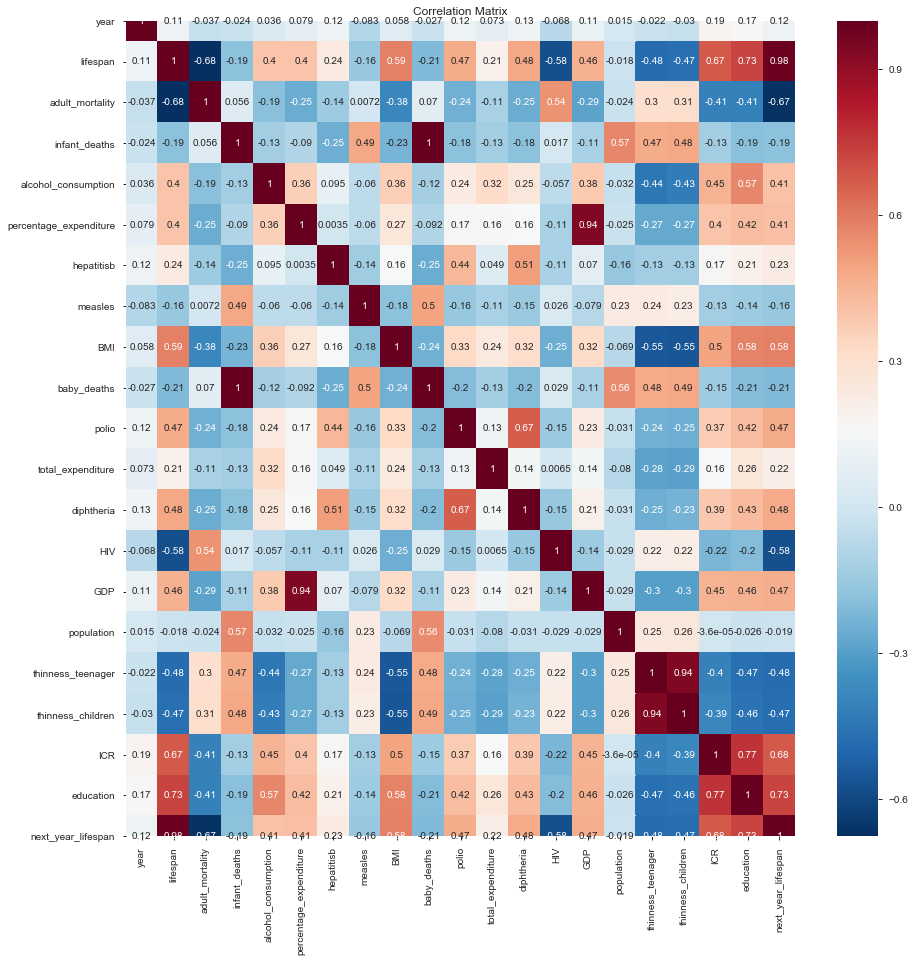

In [129]:
corr_matrix = train.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, cmap='RdBu_r')
plt.title('Correlation Matrix')

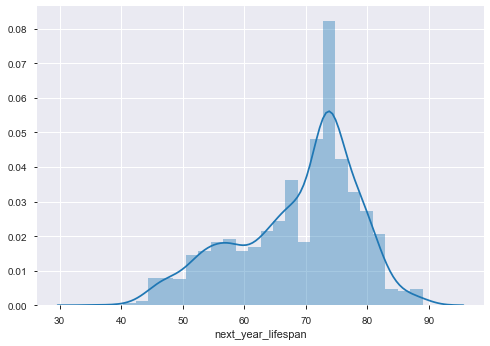

In [94]:
sns.distplot(y_train);

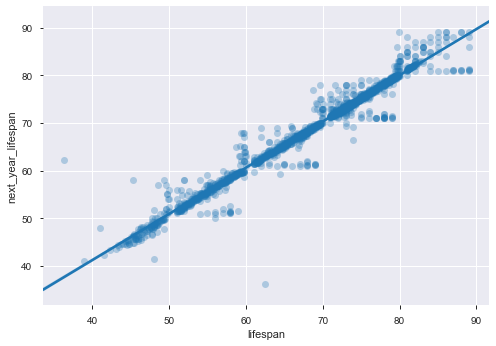

In [95]:
sns.regplot(x=train['lifespan'],y=train['next_year_lifespan'], scatter_kws={'alpha':0.3});

In [9]:
px.scatter_matrix(train, dimensions=['lifespan', 'baby_deaths', 'infant_deaths', 'education'], color="development")

In [10]:
px.scatter(train, x="lifespan", y="next_year_lifespan", color="year", trendline="ols", marginal_x="violin", marginal_y="box")

In [11]:
px.scatter(train, x="adult_mortality", y="GDP", color="next_year_lifespan", trendline="ols", marginal_x="violin", marginal_y="box")

In [12]:
px.scatter(train, x="adult_mortality", y="next_year_lifespan", color="development", trendline="ols", marginal_x="violin", marginal_y="box")

In [13]:
px.violin(train, y="next_year_lifespan", x="year", box=True, points="all")

In [14]:
px.scatter(train,
          x="alcohol_consumption",
          y="next_year_lifespan",
          color='development',
          hover_name="country",
          animation_frame="year",
          animation_group="country",
          range_x=[0,18],
          range_y=[30,90])

In [15]:
px.scatter(train,
          x="adult_mortality",
          y="next_year_lifespan",
          color='development',
          hover_name="country",
          animation_frame="year",
          animation_group="country",
          range_x=[0,725],
          range_y=[30,90])

In [24]:
fig = px.violin(train, y="next_year_lifespan", x="development", color="year", box=True, points="all")
fig.show()

In [27]:
py.plot(fig, filename='development', auto_open=True)

'https://plot.ly/~veramendes/1/'

In [17]:
px.scatter_matrix(train, dimensions=['next_year_lifespan', 'polio', 'measles', 'hepatitisb', 'diphtheria', 'HIV'], color="development")

In [56]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [18]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.7982997737737991
Val R²: 0.9605662441917775


In [98]:
# using feature permutation on my model
permuter = PermutationImportance(
    model, 
    scoring='neg_mean_absolute_error', 
    n_iter=5, 
    random_state=42
)

permuter.fit(X_val_transformed, y_val)

PermutationImportance(cv='prefit',
                      estimator=LinearRegression(copy_X=True,
                                                 fit_intercept=True,
                                                 n_jobs=None, normalize=False),
                      n_iter=5, random_state=42, refit=True,
                      scoring='neg_mean_absolute_error')

In [99]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending=False)

lifespan                  8.029416
baby_deaths               0.161055
infant_deaths             0.132750
education                 0.039954
HIV                       0.020137
adult_mortality           0.016522
polio                     0.013247
percentage_expenditure    0.012566
ICR                       0.007078
development               0.006720
total_expenditure         0.004848
diphtheria                0.003757
thinness_teenager         0.003579
thinness_children         0.002667
alcohol_consumption       0.001677
GDP                       0.001452
hepatitisb                0.000750
country                   0.000467
population                0.000021
measles                  -0.000010
year                     -0.000039
BMI                      -0.001309
dtype: float64

In [100]:
# looking into feature importance and weight
eli5.show_weights(
    permuter, 
    top=None,
    feature_names = feature_names
)

Weight,Feature
8.0294 ± 0.3768,lifespan
0.1611 ± 0.0188,baby_deaths
0.1327 ± 0.0268,infant_deaths
0.0400 ± 0.0175,education
0.0201 ± 0.0119,HIV
0.0165 ± 0.0065,adult_mortality
0.0132 ± 0.0142,polio
0.0126 ± 0.0227,percentage_expenditure
0.0071 ± 0.0048,ICR
0.0067 ± 0.0047,development


In [101]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['next_year_lifespan', 'BMI', 'year', 'measles', 'population']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [19]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [20]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.7982997737737991
Val R²: 0.9605662441917775


In [112]:
train.head()

,country,year,development,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,...,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education,next_year_lifespan
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989,...,9.20,66.0,0.1,553.328940,2883167.0,18.4,18.4,0.448,9.2,59.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861,...,9.42,63.0,0.1,445.893298,284331.0,18.6,18.7,0.434,8.9,58.8
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599,...,8.33,64.0,0.1,373.361116,2729431.0,18.8,18.9,0.433,8.7,58.6
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141,...,6.73,63.0,0.1,369.835796,26616792.0,19.0,19.1,0.415,8.4,58.1
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990,...,7.43,58.0,0.1,272.563770,2589345.0,19.2,19.3,0.405,8.1,57.5


In [122]:
train.columns

Index(['country', 'year', 'development', 'lifespan', 'adult_mortality',
       'infant_deaths', 'alcohol_consumption', 'percentage_expenditure',
       'hepatitisb', 'measles', 'BMI', 'baby_deaths', 'polio',
       'total_expenditure', 'diphtheria', 'HIV', 'GDP', 'population',
       'thinness_teenager', 'thinness_children', 'ICR', 'education',
       'next_year_lifespan'],
      dtype='object')

In [21]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['next_year_lifespan', 'BMI', 'year', 'measles', 'population', 'thinness_teenager', 'percentage_expenditure',
               'infant_deaths']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [22]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [23]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.8005917974172213
Val R²: 0.961140507688103


In [24]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['country', 'year', 'development','BMI','hepatitisb', 'measles',
                'total_expenditure', 'diphtheria', 'GDP','population',
                'thinness_teenager', 'thinness_children','next_year_lifespan',
                'alcohol_consumption']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [25]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [26]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.7982997737737991
Val R²: 0.9605662441917775


In [67]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['country', 'year', 'development','infant_deaths',
                'percentage_expenditure','hepatitisb', 'measles',
                'polio','total_expenditure', 'diphtheria', 'GDP',
                'population', 'thinness_teenager', 'next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [68]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [69]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.7694277849740445
Val R²: 0.9612588745372511


In [170]:
# using feature permutation on my model
permuter = PermutationImportance(
    model, 
    scoring='neg_mean_absolute_error', 
    n_iter=5, 
    random_state=42
)

permuter.fit(X_val_transformed, y_val)

PermutationImportance(cv='prefit',
                      estimator=LinearRegression(copy_X=True,
                                                 fit_intercept=True,
                                                 n_jobs=None, normalize=False),
                      n_iter=5, random_state=42, refit=True,
                      scoring='neg_mean_absolute_error')

In [171]:
feature_names = X_val.columns.tolist()
pd.Series(permuter.feature_importances_, feature_names).sort_values(ascending=False)

lifespan               8.300482
education              0.065039
ICR                    0.017946
adult_mortality        0.017553
alcohol_consumption    0.016479
HIV                    0.012740
BMI                    0.004370
thinness_children      0.004276
baby_deaths            0.000463
dtype: float64

In [172]:
# looking into feature importance and weight
eli5.show_weights(
    permuter, 
    top=None,
    feature_names = feature_names
)

Weight,Feature
8.3005 ± 0.4014,lifespan
0.0650 ± 0.0157,education
0.0179 ± 0.0059,ICR
0.0176 ± 0.0013,adult_mortality
0.0165 ± 0.0092,alcohol_consumption
0.0127 ± 0.0048,HIV
0.0044 ± 0.0047,BMI
0.0043 ± 0.0030,thinness_children
0.0005 ± 0.0017,baby_deaths


In [173]:
train.corr()

,year,lifespan,adult_mortality,infant_deaths,alcohol_consumption,percentage_expenditure,hepatitisb,measles,BMI,baby_deaths,...,total_expenditure,diphtheria,HIV,GDP,population,thinness_teenager,thinness_children,ICR,education,next_year_lifespan
year,1.000000,0.111779,-0.037286,-0.024151,0.036364,0.079075,0.119263,-0.082943,0.058434,-0.027247,...,0.073386,0.127565,-0.068287,0.105835,0.014619,-0.022230,-0.030137,0.187243,0.165990,0.119423
lifespan,0.111779,1.000000,-0.677141,-0.185296,0.401758,0.403295,0.235122,-0.157584,0.585561,-0.211876,...,0.206703,0.483308,-0.576526,0.462401,-0.017917,-0.481498,-0.472759,0.674957,0.727770,0.981535
adult_mortality,-0.037286,-0.677141,1.000000,0.055745,-0.191140,-0.254509,-0.143408,0.007189,-0.382535,0.069689,...,-0.109146,-0.252189,0.538571,-0.289860,-0.024198,0.304765,0.309945,-0.405739,-0.414929,-0.670029
infant_deaths,-0.024151,-0.185296,0.055745,1.000000,-0.127255,-0.089537,-0.246971,0.488687,-0.230040,0.996887,...,-0.129179,-0.182916,0.016940,-0.108954,0.570865,0.470589,0.483119,-0.128139,-0.189349,-0.185003
alcohol_consumption,0.036364,0.401758,-0.191140,-0.127255,1.000000,0.358002,0.094867,-0.060222,0.364904,-0.123812,...,0.319131,0.253343,-0.056517,0.379316,-0.032099,-0.441465,-0.425584,0.454848,0.572896,0.406717
percentage_expenditure,0.079075,0.403295,-0.254509,-0.089537,0.358002,1.000000,0.003514,-0.060022,0.265915,-0.092330,...,0.164667,0.161251,-0.110278,0.936734,-0.024791,-0.270837,-0.270537,0.401523,0.421885,0.410961
hepatitisb,0.119263,0.235122,-0.143408,-0.246971,0.094867,0.003514,1.000000,-0.139196,0.161369,-0.254563,...,0.048865,0.514973,-0.108448,0.070342,-0.161765,-0.127266,-0.130902,0.172798,0.205336,0.233317
measles,-0.082943,-0.157584,0.007189,0.488687,-0.060222,-0.060022,-0.139196,1.000000,-0.179751,0.499223,...,-0.108158,-0.151753,0.026426,-0.079086,0.232010,0.238430,0.226690,-0.127452,-0.142155,-0.156654
BMI,0.058434,0.585561,-0.382535,-0.230040,0.364904,0.265915,0.161369,-0.179751,1.000000,-0.241633,...,0.244889,0.317201,-0.247284,0.321794,-0.069329,-0.551686,-0.554845,0.499207,0.579646,0.581975
baby_deaths,-0.027247,-0.211876,0.069689,0.996887,-0.123812,-0.092330,-0.254563,0.499223,-0.241633,1.000000,...,-0.130676,-0.203831,0.029009,-0.112918,0.561050,0.477254,0.487437,-0.146193,-0.205147,-0.211115


In [174]:
print('Model Coeficient:', model.coef_)
print('Model Intercept:', model.intercept_)

Model Coeficient: [ 9.18308162e-01 -6.27943932e-04  2.45160807e-02  2.00003217e-03
 -1.22402351e-04 -4.31671924e-02 -1.08829599e-02  5.04212029e-01
  6.03449467e-02]
Model Intercept: 5.000359125731194


In [57]:
# trying selectKbest for feature choice 
selector = SelectKBest(score_func=f_regression, k=5)
X_train_selected = selector.fit_transform(X_train_transformed, y_train)
X_val_selected = selector.transform(X_val_transformed)
X_train_selected.shape, X_val_selected.shape

((2013, 5), (366, 5))

In [58]:
# features selected by selectkbest
all_features = X_train.columns
selected_mask = selector.get_support()
selected_features = all_features[selected_mask]

print('Features selected:')
for feature in selected_features:
    print(feature)

Features selected:
lifespan
adult_mortality
BMI
ICR
education


In [59]:
# using Linear Regression
for k in range(1, len(X_train.columns)+1):
    print(f'{k} features')
    
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_transformed, y_train)
    X_val_selected = selector.transform(X_val_transformed)
    
    model = LinearRegression()
    model.fit(X_train_selected, y_train)
    
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    print(f'Val MAE:{mae:,.4f} \n')

1 features
Val MAE:0.7139 

2 features
Val MAE:0.7197 

3 features
Val MAE:0.7271 

4 features
Val MAE:0.7273 

5 features
Val MAE:0.7328 

6 features
Val MAE:0.7690 

7 features
Val MAE:0.7720 

8 features
Val MAE:0.7744 

9 features
Val MAE:0.7763 

10 features
Val MAE:0.7824 

11 features
Val MAE:0.7828 

12 features
Val MAE:0.7981 

13 features
Val MAE:0.8010 

14 features
Val MAE:0.7999 

15 features
Val MAE:0.8061 

16 features
Val MAE:0.8059 

17 features
Val MAE:0.8090 

18 features
Val MAE:0.8101 

19 features
Val MAE:0.8099 

20 features
Val MAE:0.8261 

21 features
Val MAE:0.8262 

22 features
Val MAE:0.8264 



In [76]:
# choosing different X features matrix & defining my y target vector
target = 'next_year_lifespan'
cols_to_drop = ['country', 'year', 'development', 'adult_mortality',
       'infant_deaths', 'alcohol_consumption', 'percentage_expenditure',
       'hepatitisb', 'measles', 'BMI', 'baby_deaths', 'polio',
       'total_expenditure', 'diphtheria', 'HIV', 'GDP', 'population',
       'thinness_teenager', 'thinness_children', 'ICR', 'education',
       'next_year_lifespan']
X_train = train[train.columns.drop(cols_to_drop)]
y_train = train['next_year_lifespan']
X_val = val[val.columns.drop(cols_to_drop)]
y_val = val['next_year_lifespan']
X_test = test[test.columns.drop(cols_to_drop)]
y_test = test['next_year_lifespan']

In [77]:
transformers = make_pipeline(
    ce.OrdinalEncoder(), 
    SimpleImputer(strategy='mean'), 
)

X_train_transformed = transformers.fit_transform(X_train)
X_val_transformed = transformers.transform(X_val)
X_test_transformed = transformers.transform(X_test)

In [78]:
model = LinearRegression()
model.fit(X_train_transformed, y_train)
y_pred = model.predict(X_val_transformed)
r2_val = r2_score(y_val, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_val, y_pred))
print('Val R\u00b2:', r2_val)

Mean Absolut error: 0.7138953933057682
Val R²: 0.9605011013266168


In [79]:
print('Model Coeficient:', model.coef_)
print('Model Intercept:', model.intercept_)

Model Coeficient: [0.9700494]
Model Intercept: 2.4014400367963447


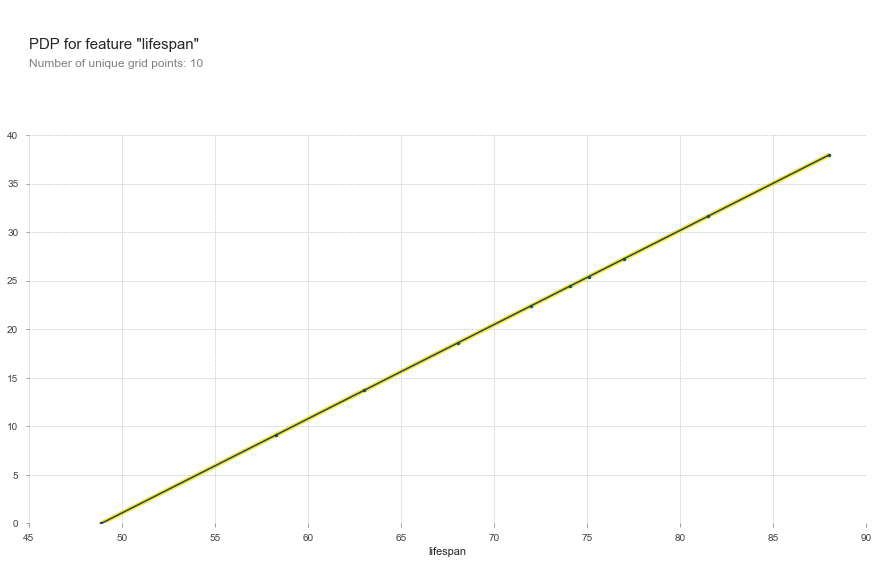

In [110]:
feature = 'lifespan'

isolated = pdp_isolate(
    model=model, 
    dataset=X_val, 
    model_features=X_val.columns,
    feature=feature,
    
)
pdp_plot(isolated, feature_name=feature, plot_lines=True, frac_to_plot=50);
plt.xlim(45,90);
plt.ylim(0,40);

In [86]:
# final test validation
y_pred = model.predict(X_test_transformed)
r2_test = r2_score(y_test, y_pred)
print('Mean Absolut error:', mean_absolute_error(y_test, y_pred))
print('Test R\u00b2:', r2_test)

Mean Absolut error: 0.6953031231080772
Test R²: 0.9563103483156468


In [92]:
y_true = pd.Series(y_test, index=test.index)
y_prediction= pd.Series(y_pred, index=test.index)

In [100]:
data = {'country': test['country'],'development':test['development'], 'year': test['year'], 'y_true':y_true, 'y_pred':y_prediction} 
  
# Creating prediction DataFrame 
results = pd.DataFrame(data) 
  
# Printing the output 
results 


,country,development,year,y_true,y_pred
1,Afghanistan,Developing,2014,65.0,60.507399
2,Afghanistan,Developing,2013,59.9,60.507399
17,Albania,Developing,2014,77.8,77.580269
18,Albania,Developing,2013,77.5,77.289254
33,Algeria,Developing,2014,75.6,75.543165
...,...,...,...,...,...
2892,Yemen,Developing,2013,65.4,65.842671
2907,Zambia,Developing,2014,61.8,61.671458
2908,Zambia,Developing,2013,61.1,63.514552
2923,Zimbabwe,Developing,2014,67.0,59.828365


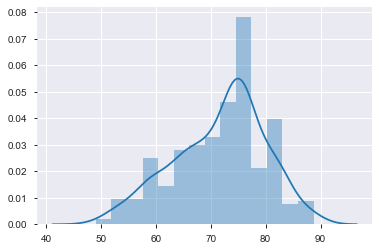

In [107]:
sns.distplot(y_pred);

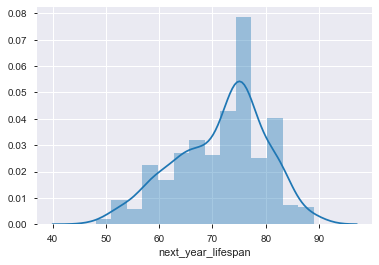

In [108]:
sns.distplot(y_true);

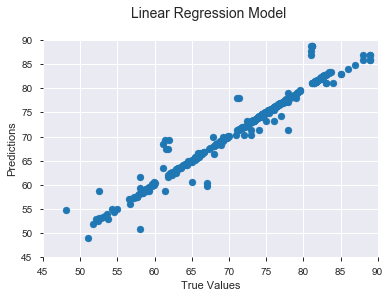

In [137]:
plt.title('Linear Regression Model \n', size = 14)
plt.scatter(y_true, y_pred)
# plt.plot(y_true, y_pred, color="red")
plt.xlim(45,90)
plt.ylim(45,90)
plt.xlabel("True Values")
plt.ylabel("Predictions")
plt.show()

In [96]:
# y = m*x + b (Cartesian plotting formula)
m = model.coef_[0]
b = model.intercept_
print('y = mx + b')
print(f'y = {m:.2f}*x + {b:.2f}')
print(f'following year life expectancy = {m:.2f}*current year life expectancy + {b:.2f}')

y = mx + b
y = 0.97*x + 2.40
following year life expectancy = 0.97*current year life expectancy + 2.40


In [122]:
def predict(lifespan):
    y_pred = model.predict([[lifespan]])
    estimate = y_pred[0]
    coefficient = model.coef_[0]
    result = f'{estimate:,.2f} is the estimated life expectancy on the following year as {lifespan:,.2f} years life expectancy in the current year. '
    explanation = f'In this linear regression, each additional year on current life expectancy adds {coefficient:,.2f} years to the next year life expectancy.'
    return result + explanation

'60.60 is the estimated life expectancy on the following year as 60.00 years life expectancy in the current year. In this linear regression, each additional year on current life expectancy adds 0.97 years to the next year life expectancy.'

In [125]:
predict(72)

'72.24 is the estimated life expectancy on the following year as 72.00 years life expectancy in the current year. In this linear regression, each additional year on current life expectancy adds 0.97 years to the next year life expectancy.'